In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import os

import numpy as np

from pylops.basicoperators import *
from pylops.optimization.sparsity import fista
from pylops.utils.metrics import snr
from pylops.basicoperators import FirstDerivative, Diagonal
from pylops.signalprocessing import FFT2D

from landmc.preprocessing import mask, mask_cut, subsample, fk_transform, fk_filter_design,plot_reconstruction_2d_real
from landmc.nmoinv import NMO
from landmc.slopes import multicomponent_slopes_inverse
from landmc.MCReconstruction import MCdata

import matplotlib.pyplot as plt
import cupy as cp
cp_asarray = cp.asarray
cp_asnumpy = cp.asnumpy

apply_nmo = True

In [2]:
# slope estimation
eps_slopeest = 5e3# regularization factor for smoothing
niter_slopeest = 5e3 # number of iterations of lsqr

#Plotting Params
clip_v = 5e-2
clip_fk = 3e-2
fk_uplim = 160
clip_slope = 1e-4
save_fig_folder = "../figures/"

## Load data

In [3]:
#Load data
file = np.load("../data/StrydeGradient_preprocessed.npz")
data = file['rec1']
d1_data = file['d1'].T
sc1 = file['sc1']

#Time and space axis
x = np.arange(0,88,0.5)
t = file['t'] #ms
t-=t[0]
dt = (t[1]-t[0])
dx = x[1]-x[0]

#Put data into the desired dense grid
data_full = np.zeros((data.shape[0]*4,data.shape[1]))
d1_full = np.zeros((data.shape[0]*4,data.shape[1]))
data_full[::4] = data
d1_full[::4] = d1_data


In [4]:
nfft_t, nfft_x = 2**12, 2**12

nx = data.shape[0]
nt = data.shape[1]

D2m,_,_,Fop2m = fk_transform(data, nfft_x, nfft_t, 2, dt)
D, f, ks, Fop = fk_transform(data_full, nfft_x, nfft_t, dx, dt)

In [5]:
#Disp kwargs
show_seis_kwargs = dict(aspect='auto',cmap='seismic',vmin=-clip_v,vmax=clip_v,extent=(x[0]/1000, x[-1]/1000, t[-1], t[10]))
show_fk_kwargs = dict(cmap='gist_ncar_r',aspect='auto', 
                      extent=(np.fft.fftshift(ks)[0], np.fft.fftshift(ks)[-1], f[-1], f[0]),vmin=0,vmax=clip_fk)

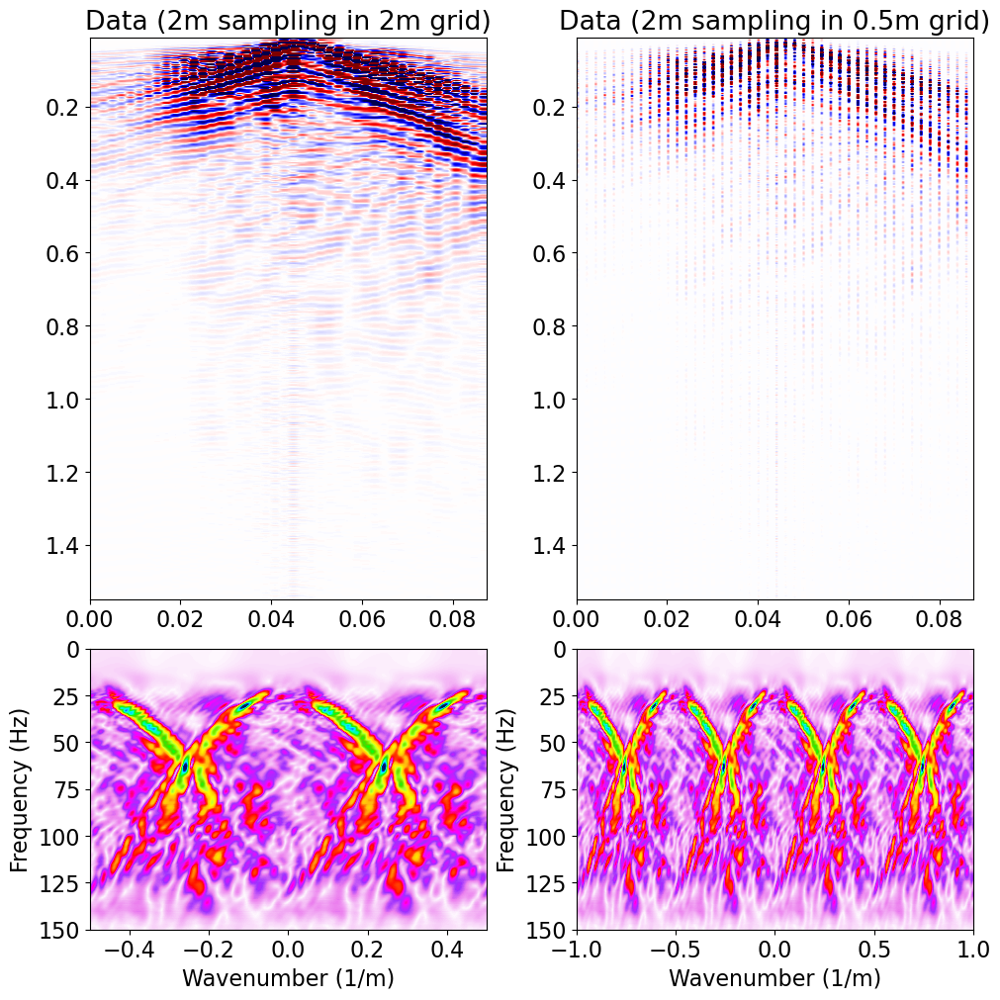

In [6]:
fig = plt.figure(constrained_layout=True, figsize=(10, 10))
axs = []
gs = fig.add_gridspec(3, 2)
axs.append(fig.add_subplot(gs[:2, 0]))
axs.append(fig.add_subplot(gs[2, 0]))
axs.append(fig.add_subplot(gs[:2, 1]))
axs.append(fig.add_subplot(gs[2, 1]))

axs[0].imshow(data.T,**show_seis_kwargs)
axs[0].set_title("Data (2m sampling in 2m grid)")
axs[1].imshow(np.fft.fftshift(np.abs(D).T, axes=1), **show_fk_kwargs)
axs[1].set_xlim(-1/(2), 1/(2))
axs[1].set_ylim(150,0)
axs[1].set_xlabel("Wavenumber (1/m)")
axs[1].set_ylabel("Frequency (Hz)")

axs[2].imshow(data_full.T,**show_seis_kwargs)
axs[2].set_title("Data (2m sampling in 0.5m grid)")
axs[3].imshow(np.fft.fftshift(np.abs(D).T, axes=1), **show_fk_kwargs)
axs[3].set_xlim(-1/(2*dx), 1/(2*dx))
axs[3].set_ylim(150,0)
axs[3].set_xlabel("Wavenumber (1/m)")
axs[3].set_ylabel("Frequency (Hz)")
plt.show()

## Decimating Data

In [36]:
#Decimate Data
data_obs2m, data_mask2m, Rop2m = subsample(data_full,nsub=4)
data_mask2m = data_mask2m.data

data_obs4m, data_mask4m, Rop4m = subsample(data_full,nsub=8)
data_mask4m = data_mask4m.data

#Decimate Derivative
d1_2m,_,_ = subsample(d1_full,nsub=4)
d1_4m,_,_ = subsample(d1_full,nsub=8)

# apply FK transform to data
D_sub = Fop * data_mask2m

# Compute derivatives in FK domain
ks_d1 = np.fft.fftfreq(nfft_x, dx)
coeff1 = 1j * 2 * np.pi * ks_d1
coeff1 = np.repeat(coeff1[:, np.newaxis], nfft_t//2+1, axis=1).ravel()
D1op = Diagonal(coeff1)

sc1 = np.max(np.abs(data_obs2m)) / np.max(np.abs(d1_2m))

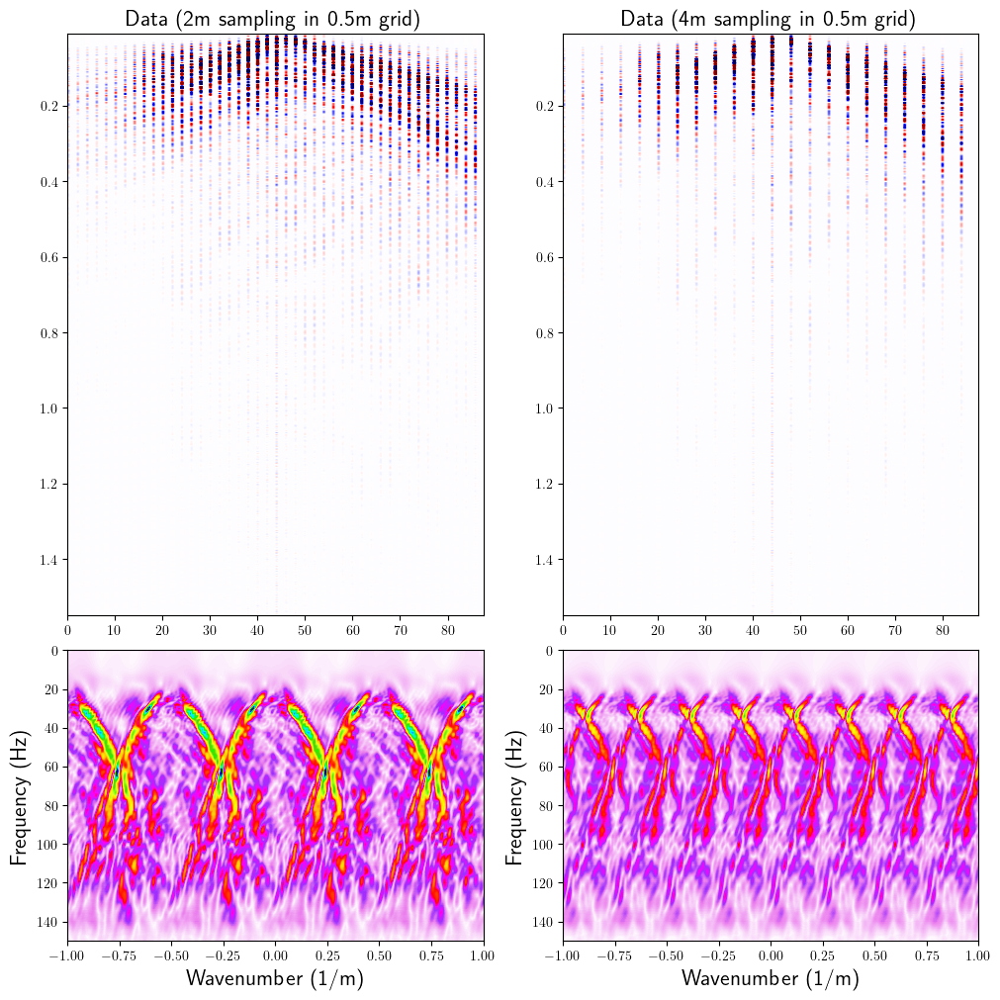

In [37]:
fig = plt.figure(constrained_layout=True, figsize=(10, 10))
axs = []
gs = fig.add_gridspec(3, 2)
axs.append(fig.add_subplot(gs[:2, 0]))
axs.append(fig.add_subplot(gs[2, 0]))
axs.append(fig.add_subplot(gs[:2, 1]))
axs.append(fig.add_subplot(gs[2, 1]))

axs[0].imshow(data_mask2m.T,**show_seis_kwargs)
axs[0].set_title("Data (2m sampling in 0.5m grid)")
axs[1].imshow(np.fft.fftshift(np.abs(D).T, axes=1), **show_fk_kwargs)
axs[1].set_xlim(-1/(2*dx), 1/(2*dx))
axs[1].set_ylim(150,0)
axs[1].set_xlabel("Wavenumber (1/m)")
axs[1].set_ylabel("Frequency (Hz)")

axs[2].imshow(data_mask4m.T,**show_seis_kwargs)
axs[2].set_title("Data (4m sampling in 0.5m grid)")
axs[3].imshow(np.fft.fftshift(np.abs(Fop*data_mask4m).T, axes=1), **show_fk_kwargs)
axs[3].set_xlim(-1/(2*dx), 1/(2*dx))
axs[3].set_ylim(150,0)
axs[3].set_xlabel("Wavenumber (1/m)")
axs[3].set_ylabel("Frequency (Hz)")
plt.show()

## Separating Direct/Refraction wave with Groundroll

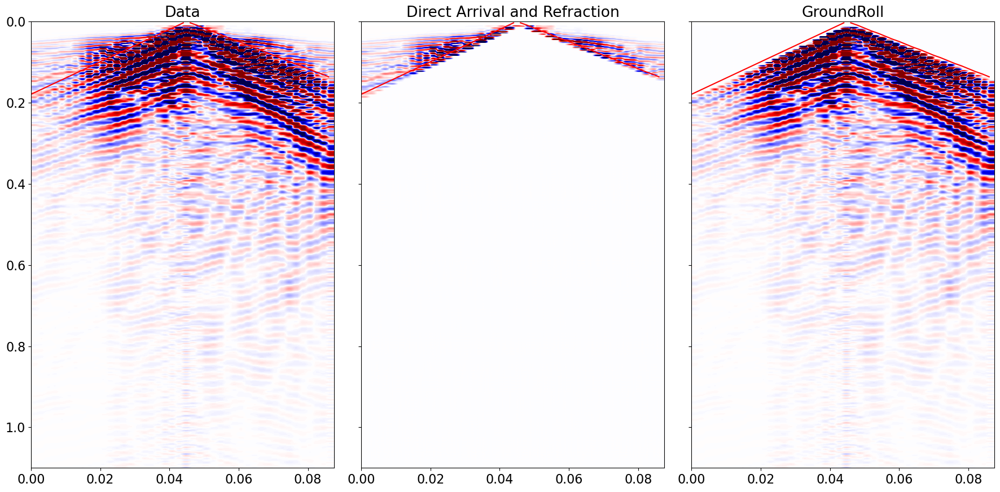

In [9]:
def mask_cut(data,vcut,t,dt,offset,it0=0,cut='up'):
    #Mute direct and refracted wave
    pcut = 1/vcut
    data_cut = data.copy()
    nx = len(offset)

    ix = np.arange(nx)
    tevent = t[0] + offset * pcut
    tevent = (tevent - t[0]) / dt
    itevent = tevent.astype(int)+it0
    mask = (itevent < nt - 1) & (itevent >= it0)
    for i in range(nx):
        #For every trace
        if i<len(itevent[mask]):
            if cut=='up':
                data_cut[ix[mask][i],:itevent[mask][i]] = 0
            elif cut=='down':
                data_cut[ix[mask][i],itevent[mask][i]:] = 0
    #     else:
    #         data_cut[i,:nt]=0
    
    return data_cut,mask,itevent

vdown1 = 300
vdown2 = 250

#Separate the 2m data
offsetleft = -(x[::4]-x[data_full.shape[0]//2+2])
offsetright = x[::4]-x[data_full.shape[0]//2+2]

data_cut2m,mask2,itevent2 = mask_cut(data_obs2m,vdown1,t,dt,offsetright,cut='down')
data_cut2m,mask4,itevent4 = mask_cut(data_cut2m,vdown2,t,dt,offsetleft,cut='down')
d1_cut2m,mask2,itevent2 = mask_cut(d1_2m,vdown1,t,dt,offsetright,cut='down')
d1_cut2m,mask4,itevent4 = mask_cut(d1_cut2m,vdown2,t,dt,offsetleft,cut='down')

data_GR2m = data_obs2m - data_cut2m
data_noGR2m = data_cut2m
d1_GR2m = d1_2m - d1_cut2m
d1_noGR2m = d1_cut2m

offsetright = offsetright + x[data_full.shape[0]//2+2]
offsetleft = -(offsetleft-x[data_full.shape[0]//2+2])

#Separate the 4m data
offsetleft = -(x[::8]-x[data_full.shape[0]//2+2])
offsetright = x[::8]-x[data_full.shape[0]//2+2]

data_cut4m,_,_ = mask_cut(data_obs4m,vdown1,t,dt,offsetright,cut='down')
data_cut4m,_,_ = mask_cut(data_cut4m,vdown2,t,dt,offsetleft,cut='down')
d1_cut4m,_,_ = mask_cut(d1_4m,vdown1,t,dt,offsetright,cut='down')
d1_cut4m,_,_ = mask_cut(d1_cut4m,vdown2,t,dt,offsetleft,cut='down')

data_GR4m = data_obs4m - data_cut4m
data_noGR4m = data_cut4m
d1_GR4m = d1_4m - d1_cut4m
d1_noGR4m = d1_cut4m

offsetleft = -(x[::4]-x[data_full.shape[0]//2+2])
offsetright = x[::4]-x[data_full.shape[0]//2+2]
offsetright = offsetright + x[data_full.shape[0]//2+2]
offsetleft = -(offsetleft-x[data_full.shape[0]//2+2])


fig,axs = plt.subplots(1,3,figsize=(18,9),sharey=True)
axs[0].imshow(data_obs2m.T,  **show_seis_kwargs)
axs[0].set_ylim((1.1,0))
axs[0].set_title("Data")

axs[0].plot(offsetleft[mask2]/1000,itevent2[mask2]*dt,c='red')
axs[0].plot(offsetright[mask4]/1000,itevent4[mask4]*dt,c='red')

axs[1].imshow(data_cut2m.T,  **show_seis_kwargs)
axs[1].set_title("Direct Arrival and Refraction")

axs[1].plot(offsetleft[mask2]/1000,itevent2[mask2]*dt,c='red')
axs[1].plot(offsetright[mask4]/1000,itevent4[mask4]*dt,c='red')

axs[2].imshow(data_GR2m.T,  **show_seis_kwargs)
axs[2].set_title("GroundRoll")

axs[2].plot(offsetleft[mask2]/1000,itevent2[mask2]*dt,c='red')
axs[2].plot(offsetright[mask4]/1000,itevent4[mask4]*dt,c='red')
plt.tight_layout()
plt.show()

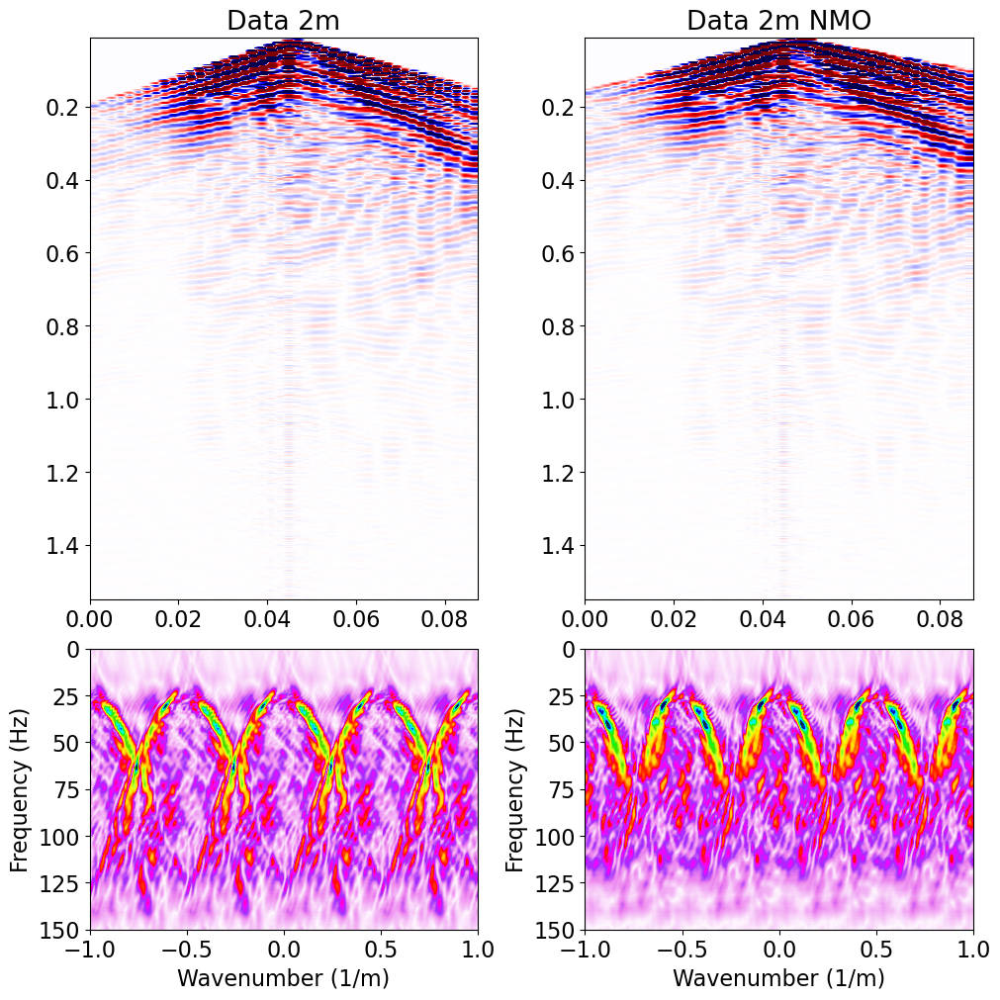

In [10]:
#NMO Correction
if apply_nmo:
    vnmo = 400
    #2m nmo
    x_obs = x[::4]
    x_mid = x_obs[len(x_obs)//2]
    NMOoporig = NMO(t,x-x_mid,vnmo*np.ones(nt))
    NMOop = NMO(t,x_obs-x_mid,vnmo*np.ones(nt))
    data_GR2mnonmo = data_GR2m
    data_GR2m = NMOop @ data_GR2m
    d1_GR2m = NMOop @ d1_GR2m
    
    #4m nmo
    x_obs = x[::8]
    x_mid = x_obs[len(x_obs)//2]
    NMOop = NMO(t,x_obs-x_mid,vnmo*np.ones(nt))
    data_GR4m = NMOop @ data_GR4m
    d1_GR4m = NMOop @ d1_GR4m
    
fig = plt.figure(constrained_layout=True, figsize=(10, 10))
axs = []
gs = fig.add_gridspec(3, 2)
axs.append(fig.add_subplot(gs[:2, 0]))
axs.append(fig.add_subplot(gs[2, 0]))
axs.append(fig.add_subplot(gs[:2, 1]))
axs.append(fig.add_subplot(gs[2, 1]))

axs[0].imshow(data_GR2mnonmo.T,**show_seis_kwargs)
axs[0].set_title("Data 2m")
axs[1].imshow(np.fft.fftshift(np.abs(Fop*Rop2m.H*data_GR2mnonmo).T, axes=1), **show_fk_kwargs)
axs[1].set_xlim(-1/(2*dx), 1/(2*dx))
axs[1].set_ylim(150,0)
axs[1].set_xlabel("Wavenumber (1/m)")
axs[1].set_ylabel("Frequency (Hz)")

axs[2].imshow(data_GR2m.T,**show_seis_kwargs)
axs[2].set_title("Data 2m NMO")
axs[3].imshow(np.fft.fftshift(np.abs(Fop*Rop2m.H*data_GR2m).T, axes=1), **show_fk_kwargs)
axs[3].set_xlim(-1/(2*dx), 1/(2*dx))
axs[3].set_ylim(150,0)
axs[3].set_xlabel("Wavenumber (1/m)")
axs[3].set_ylabel("Frequency (Hz)")
plt.show()

## Set up F-K Mask

In [29]:
# F-K Mask
vel = 190. # velocity
vel2 = 100
fmax = 200 # maximum frequency
critical = 1.00 # scaling to be applied to the f=k*v line used to create the mask
koffset = 0.001 # shift to be applied to the f=k*v line used to create the mask

mask_fk = fk_filter_design(f, ks, vel, fmax, critical=critical, koffset=koffset)
Mf = Diagonal(mask_fk.astype(np.complex).T.ravel(), dtype=np.complex128)

mask_fk2 = fk_filter_design(f, ks, vel2, fmax, critical=critical, koffset=koffset)
Mf2 = Diagonal(mask_fk2.astype(np.complex).T.ravel(), dtype=np.complex128)

/tmp/ipykernel_262806/3743134193.py:9: DeprecationWarning: `np.complex` is a deprecated alias for the builtin `complex`. To silence this warning, use `complex` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.complex128` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  Mf = Diagonal(mask_fk.astype(np.complex).T.ravel(), dtype=np.complex128)
/tmp/ipykernel_262806/3743134193.py:12: DeprecationWarning: `np.complex` is a deprecated alias for the builtin `complex`. To silence this warning, use `complex` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.complex128` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  Mf2 = Diagonal(mask_fk2.astype(np.complex).T.ravel(), dtype=np.complex128)


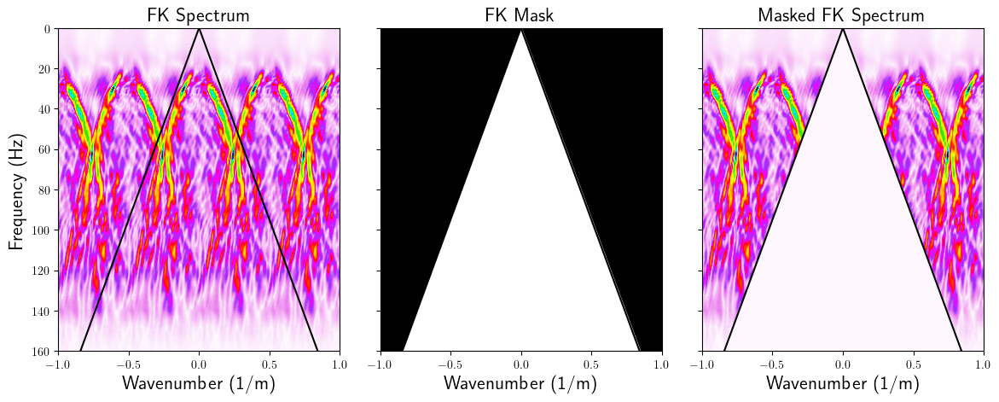

In [30]:
fig, axs = plt.subplots(1, 3, sharey=True, figsize=(12, 5))
axs[0].imshow(np.fft.fftshift(np.abs(D).T, axes=1), **show_fk_kwargs)

axs[0].plot(f/vel, f,'k'), axs[0].plot(-f/vel, f,'k')
axs[0].set_xlim(-1/(2*dx), 1/(2*dx))
axs[0].set_xlabel('Wavenumber (1/m)')
axs[0].set_ylabel('Frequency (Hz)')
axs[0].set_title('FK Spectrum')

axs[1].imshow(np.fft.fftshift(mask_fk, axes=1), cmap='gray',aspect='auto',
              extent=(np.fft.fftshift(ks)[0], np.fft.fftshift(ks)[-1], f[nfft_t//2-1], f[0]))

axs[1].plot(f/vel, f,'k'), axs[1].plot(-f/vel, f,'k')
axs[1].set_xlim(-1/(2*dx), 1/(2*dx))
axs[1].set_xlabel('Wavenumber (1/m)')
axs[1].set_title('FK Mask')

axs[2].imshow(np.fft.fftshift((1-mask_fk)*np.abs(D).T, axes=1), **show_fk_kwargs)

axs[2].plot(f/vel, f,'k'), axs[2].plot(-f/vel, f,'k')
axs[2].set_xlim(-1/(2*dx), 1/(2*dx))
axs[2].set_ylim(fk_uplim, 0)
axs[2].set_xlabel('Wavenumber (1/m)')
axs[2].set_title('Masked FK Spectrum')
plt.tight_layout()

## Set up T-X Mask

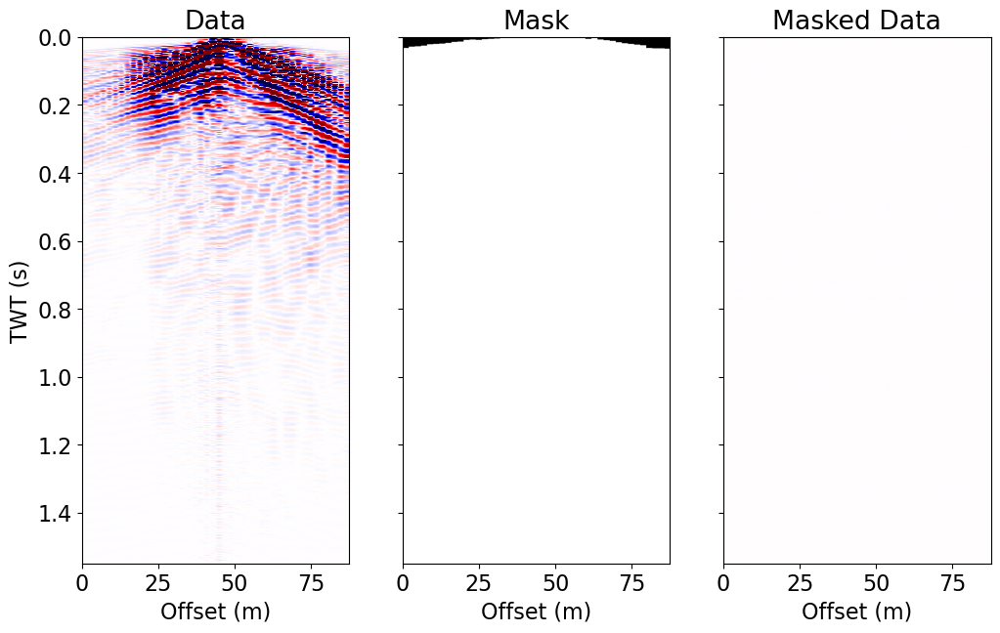

In [13]:
# Calculate time-space mask
# mask_thresh = 0.000001
mask_thresh = 0.0005
maskt2m = mask(Rop2m.H*data_obs2m, mask_thresh,itoff=5)
maskt4m = mask(Rop4m.H*data_obs4m, mask_thresh,itoff=5)
# data_obs = Rop*(maskt*data_mask)
# d1 = Rop*(maskt*d1_mask) 
 
fig, axs = plt.subplots(1, 3, figsize=(12, 7), sharey=True)
axs[0].imshow(data_obs2m.T, cmap='seismic', vmin=-clip_v, vmax=clip_v, extent=(x[0], x[-1], t[-1], t[0]))
axs[0].set_xlabel('Offset (m)')
axs[0].set_ylabel('TWT (s)')
axs[0].set_title('Data')
axs[0].axis('tight')

axs[1].imshow(maskt2m.T, cmap='gray', vmin=0, vmax=1, extent=(x[0], x[-1], t[-1], t[0]))
axs[1].set_xlabel('Offset (m)')
axs[1].set_title('Mask')
axs[1].axis('tight')

axs[2].imshow((1-(Rop2m * maskt2m).T)*data_GR2m.T, cmap='seismic', vmin=-clip_v*0.1, vmax=clip_v*0.1, extent=(x[0], x[-1], t[-1], t[0]))
axs[2].set_xlabel('Offset (m)')
axs[2].set_title('Masked Data')
axs[2].axis('tight');

In [14]:
L = 10 # np.real((Dop.H*Dop).eigs(neigs=1, which='LM')[0])
tau = 0.99
mu = 0.99 /(tau*L)
# tau = 0.99
# mu = 0.99
sigma = 1e-4
niterPD = 200
print(tau,mu)

0.99 0.09999999999999999


## Reconstruction (2m to 0.5m)

Slope Estimated


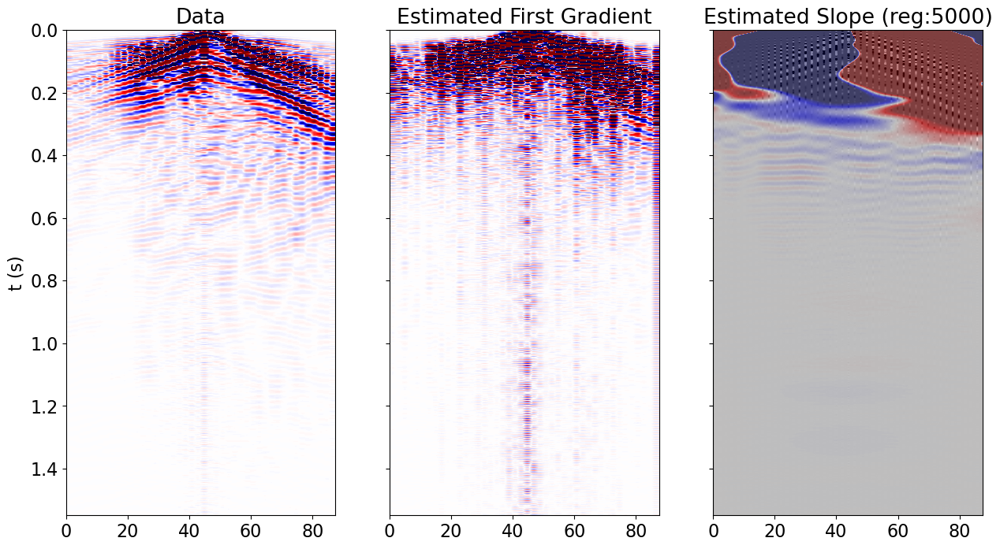

In [17]:
slope_reg_GR = 5000
slope_reg_noGR = 5000
DataGR2m = MCdata(data_GR2m,d1_GR2m,x,t,sc1,Rop2m,D1op,Fop,Mf,4,fulldata_grid=data_full)
DatanoGR2m = MCdata(data_noGR2m,d1_noGR2m,x,t,sc1,Rop2m,D1op,Fop,Mf,4,fulldata_grid=data_full)
DataGR2m.estimate_slope(reg=slope_reg_GR,niter=5000,use_weighted=False)
DatanoGR2m.estimate_slope(reg=slope_reg_noGR,niter=1000,use_weighted=False)
print("Slope Estimated")
fig,axs = plt.subplots(1,3,figsize=(15,8),sharey=True)
axs[0].imshow(data_obs2m.T,aspect='auto',vmin=-clip_v, vmax=clip_v,cmap='seismic',extent=[x[0],x[-1],t[-1],t[0]])
axs[0].set_title("Data")
axs[0].set_ylabel("t (s)")
axs[1].imshow(d1_2m.T,aspect='auto',vmin=-clip_v, vmax=clip_v,cmap='seismic',extent=[x[0],x[-1],t[-1],t[0]])
axs[1].set_title("Estimated First Gradient")
axs[2].imshow(data_mask2m.T,aspect='auto',vmin=-clip_v, vmax=clip_v,cmap='gray',extent=[x[0],x[-1],t[-1],t[0]])
axs[2].imshow(DataGR2m.slope,aspect='auto',cmap='seismic',vmin=-clip_slope,vmax=clip_slope,alpha=0.5,extent=[x[0],x[-1],t[-1],t[0]])
axs[2].set_title("Estimated Slope (reg:%d)"%slope_reg_GR)
plt.show()

In [18]:
xinvGR2m_FISTA = DataGR2m.MC_inversion_FISTA(niterPD,sigma,0.5)
xinvGR2m_FISTA = NMOoporig.div(xinvGR2m_FISTA.ravel()).reshape(data_full.shape)
xinvnoGR2m_FISTA = DatanoGR2m.MC_inversion_FISTA(niterPD,sigma,1)
xinv2m_FISTA = xinvGR2m_FISTA+xinvnoGR2m_FISTA
print("FISTA Done")

/home/khatamm/anaconda3/envs/landmc/lib/python3.10/site-packages/pylops/basicoperators/restriction.py:147: ComplexWarning: Casting complex values to real discards the imaginary part
  y[self.iavamask] = x.ravel()


FISTA (soft thresholding)
--------------------------------------------------------------------------------
The Operator Op has 409200 rows and 8392704 cols
eps = 1.000000e-04	tol = 1.000000e-10	niter = 200
alpha = 3.920119e-02	thresh = 1.960060e-06
--------------------------------------------------------------------------------
   Itn          x[0]              r2norm     r12norm     xupdate
     1   -1.58e-05+1.93e-21j    7.440e+01   7.442e+01   2.391e-01
     2   -3.15e-05+3.85e-21j    7.306e+01   7.310e+01   2.302e-01
     3   -5.14e-05+6.30e-21j    7.146e+01   7.152e+01   2.853e-01
     4   -7.54e-05+9.24e-21j    6.966e+01   6.975e+01   3.341e-01
     5   -1.03e-04+1.26e-20j    6.772e+01   6.783e+01   3.777e-01
     6   -1.35e-04+1.65e-20j    6.566e+01   6.581e+01   4.168e-01
     7   -1.70e-04+2.08e-20j    6.354e+01   6.372e+01   4.518e-01
     8   -2.08e-04+2.55e-20j    6.138e+01   6.159e+01   4.832e-01
     9   -2.49e-04+3.05e-20j    5.919e+01   5.944e+01   5.112e-01
    10   -2

/home/khatamm/anaconda3/envs/landmc/lib/python3.10/site-packages/pylops/basicoperators/restriction.py:147: ComplexWarning: Casting complex values to real discards the imaginary part
  y[self.iavamask] = x.ravel()


FISTA (soft thresholding)
--------------------------------------------------------------------------------
The Operator Op has 409200 rows and 8392704 cols
eps = 1.000000e-04	tol = 1.000000e-10	niter = 200
alpha = 1.089757e-01	thresh = 5.448785e-06
--------------------------------------------------------------------------------
   Itn          x[0]              r2norm     r12norm     xupdate
     1   -9.23e-06+1.13e-21j    3.880e+00   3.897e+00   1.702e-01
     2   -1.84e-05+2.26e-21j    3.800e+00   3.826e+00   9.752e-02
     3   -3.01e-05+3.69e-21j    3.737e+00   3.771e+00   9.590e-02
     4   -4.42e-05+5.41e-21j    3.683e+00   3.725e+00   9.642e-02
     5   -6.05e-05+7.41e-21j    3.637e+00   3.686e+00   9.771e-02
     6   -7.90e-05+9.67e-21j    3.596e+00   3.652e+00   9.858e-02
     7   -9.94e-05+1.22e-20j    3.560e+00   3.623e+00   9.843e-02
     8   -1.22e-04+1.49e-20j    3.530e+00   3.598e+00   9.713e-02
     9   -1.46e-04+1.78e-20j    3.504e+00   3.578e+00   9.476e-02
    10   -1

In [19]:
xinvGR2m = DataGR2m.MC_inversion_PD(niterPD,tau,mu,sigma,0.5)
xinvGR2m = NMOoporig.div(xinvGR2m.ravel()).reshape(data_full.shape)
xinvnoGR2m = DatanoGR2m.MC_inversion_PD(niterPD,tau,mu,sigma,1)
xinv2m = xinvGR2m+xinvnoGR2m
print("Done")

Primal-dual: min_x f(Ax) + x^T z + g(x)
---------------------------------------------------------
Proximal operator (f): <class 'pyproximal.proximal.AffineSet.AffineSet'>
Proximal operator (g): <class 'pyproximal.proximal.VStack.VStack'>
Linear operator (A): <class 'pylops.basicoperators.vstack.VStack'>
Additional vector (z): None
tau = 0.99		mu = 0.09999999999999999
theta = 1.00		niter = 200

   Itn       x[0]          f           g          z^x       J = f + g + z^x
     1   0.00000e+00   0.000e+00   4.566e+01   0.000e+00       4.566e+01
     2   0.00000e+00   0.000e+00   4.558e+01   0.000e+00       4.558e+01
     3   0.00000e+00   0.000e+00   4.913e+01   0.000e+00       4.913e+01
     4   0.00000e+00   0.000e+00   5.251e+01   0.000e+00       5.251e+01
     5   0.00000e+00   0.000e+00   5.366e+01   0.000e+00       5.366e+01
     6   0.00000e+00   0.000e+00   5.258e+01   0.000e+00       5.258e+01
     7   0.00000e+00   0.000e+00   5.045e+01   0.000e+00       5.045e+01
     8   0.00000

## Reconstruction (4m to 0.5m)

Slope Estimated


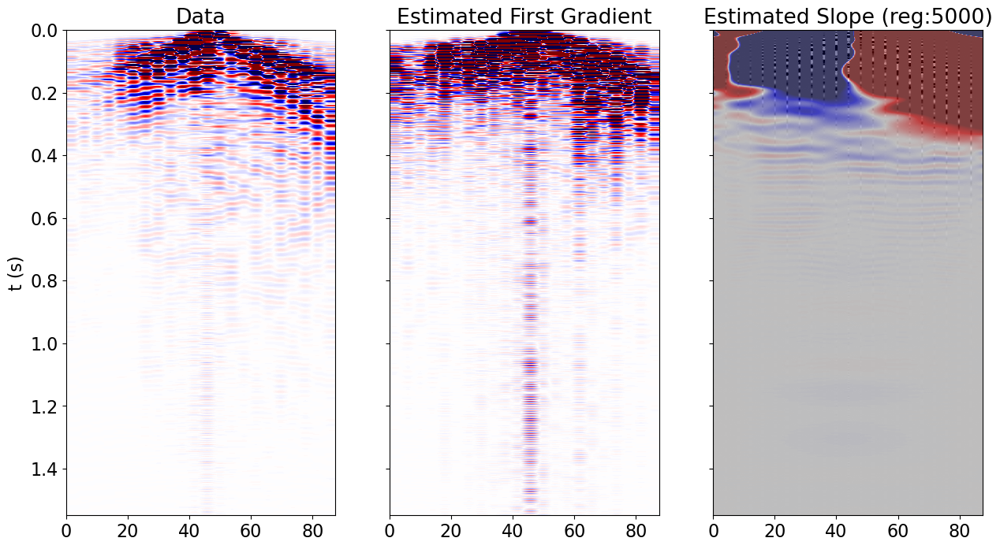

In [20]:
# For 4m data
slope_reg_GR = 5000
slope_reg_noGR = 5000
DataGR4m = MCdata(data_GR4m, d1_GR4m, x, t, sc1, Rop4m, D1op, Fop, Mf, 8, fulldata_grid=data_full)
DatanoGR4m = MCdata(data_noGR4m, d1_noGR4m, x, t, sc1, Rop4m, D1op, Fop, Mf, 8, fulldata_grid=data_full)
DataGR4m.estimate_slope(reg=slope_reg_GR, niter=5000, use_weighted=False)
DatanoGR4m.estimate_slope(reg=slope_reg_noGR, niter=1000, use_weighted=False)
print("Slope Estimated")
fig,axs = plt.subplots(1,3,figsize=(15,8),sharey=True)
axs[0].imshow(data_obs4m.T,aspect='auto',vmin=-clip_v, vmax=clip_v,cmap='seismic',extent=[x[0],x[-1],t[-1],t[0]])
axs[0].set_title("Data")
axs[0].set_ylabel("t (s)")
axs[1].imshow(d1_4m.T,aspect='auto',vmin=-clip_v, vmax=clip_v,cmap='seismic',extent=[x[0],x[-1],t[-1],t[0]])
axs[1].set_title("Estimated First Gradient")
axs[2].imshow(data_mask4m.T,aspect='auto',vmin=-clip_v, vmax=clip_v,cmap='gray',extent=[x[0],x[-1],t[-1],t[0]])
axs[2].imshow(DataGR4m.slope,aspect='auto',cmap='seismic',vmin=-clip_slope,vmax=clip_slope,alpha=0.5,extent=[x[0],x[-1],t[-1],t[0]])
axs[2].set_title("Estimated Slope (reg:%d)"%slope_reg_GR)
plt.show()

In [21]:
xinvGR4m_FISTA = DataGR4m.MC_inversion_FISTA(niterPD,sigma,0.5)
xinvGR4m_FISTA = NMOoporig.div(xinvGR4m_FISTA.ravel()).reshape(data_full.shape)
xinvnoGR4m_FISTA = DatanoGR4m.MC_inversion_FISTA(niterPD,sigma,1)
xinv4m_FISTA = xinvGR4m_FISTA+xinvnoGR4m_FISTA
print("FISTA Done")

FISTA (soft thresholding)
--------------------------------------------------------------------------------
The Operator Op has 341000 rows and 8392704 cols
eps = 1.000000e-04	tol = 1.000000e-10	niter = 200
alpha = 2.792292e-02	thresh = 1.396146e-06
--------------------------------------------------------------------------------
   Itn          x[0]              r2norm     r12norm     xupdate
     1   -1.65e-06+2.02e-22j    4.154e+01   4.155e+01   1.244e-01
     2   -3.32e-06+4.06e-22j    4.102e+01   4.104e+01   1.207e-01
     3   -5.47e-06+6.70e-22j    4.039e+01   4.043e+01   1.505e-01
     4   -8.11e-06+9.93e-22j    3.968e+01   3.973e+01   1.771e-01
     5   -1.12e-05+1.38e-21j    3.890e+01   3.897e+01   2.010e-01
     6   -1.48e-05+1.82e-21j    3.808e+01   3.816e+01   2.223e-01
     7   -1.89e-05+2.32e-21j    3.723e+01   3.733e+01   2.412e-01
     8   -2.35e-05+2.88e-21j    3.636e+01   3.648e+01   2.580e-01
     9   -2.86e-05+3.50e-21j    3.548e+01   3.562e+01   2.727e-01
    10   -3

In [22]:
xinvGR4m = DataGR4m.MC_inversion_PD(niterPD, tau, mu,sigma, 0.5)
xinvGR4m = NMOoporig.div(xinvGR4m.ravel()).reshape(data_full.shape)
xinvnoGR4m = DatanoGR4m.MC_inversion_PD(niterPD,  tau, mu,sigma, 1)
xinv4m = xinvGR4m + xinvnoGR4m
print("Done")

Primal-dual: min_x f(Ax) + x^T z + g(x)
---------------------------------------------------------
Proximal operator (f): <class 'pyproximal.proximal.AffineSet.AffineSet'>
Proximal operator (g): <class 'pyproximal.proximal.VStack.VStack'>
Linear operator (A): <class 'pylops.basicoperators.vstack.VStack'>
Additional vector (z): None
tau = 0.99		mu = 0.09999999999999999
theta = 1.00		niter = 200

   Itn       x[0]          f           g          z^x       J = f + g + z^x
     1   0.00000e+00   0.000e+00   2.719e+01   0.000e+00       2.719e+01
     2   0.00000e+00   0.000e+00   2.814e+01   0.000e+00       2.814e+01
     3   0.00000e+00   0.000e+00   3.125e+01   0.000e+00       3.125e+01
     4   0.00000e+00   0.000e+00   3.383e+01   0.000e+00       3.383e+01
     5   0.00000e+00   0.000e+00   3.468e+01   0.000e+00       3.468e+01
     6   0.00000e+00   0.000e+00   3.400e+01   0.000e+00       3.400e+01
     7   0.00000e+00   0.000e+00   3.269e+01   0.000e+00       3.269e+01
     8   0.00000

# 2m Regular survey

Slope Estimated


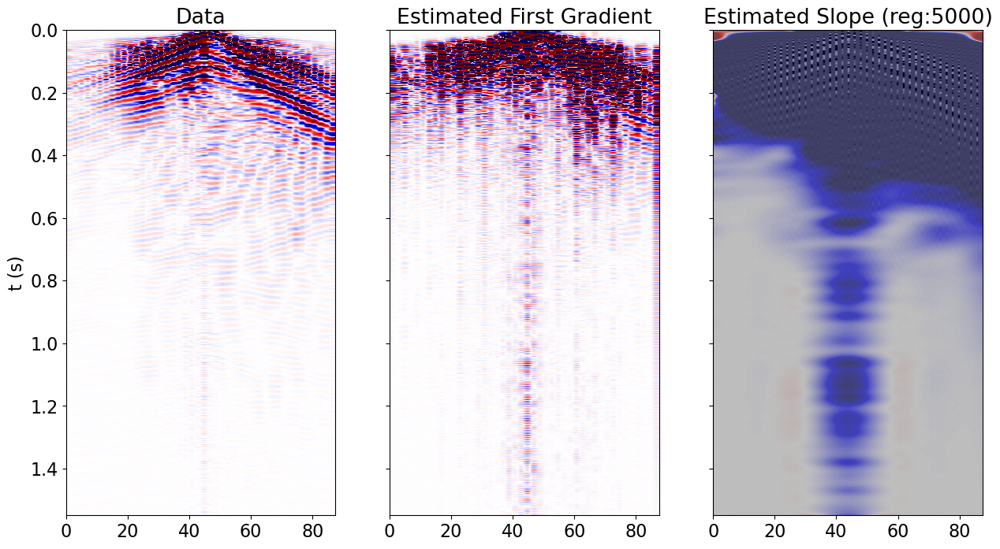

In [23]:
D1op2m = FirstDerivative((data_obs2m.shape),sampling=2,kind='forward',order=5) 
d1_reg_2m = D1op2m*data_obs2m 
Data2m = MCdata(data_obs2m, d1_reg_2m, x, t, sc1, Rop2m, D1op, Fop, Mf, 4, fulldata_grid=data_full)
Data2m.estimate_slope(reg=100,niter=1000,use_weighted=False)
print("Slope Estimated")
fig,axs = plt.subplots(1,3,figsize=(15,8),sharey=True)
axs[0].imshow(data_obs2m.T,aspect='auto',vmin=-clip_v, vmax=clip_v,cmap='seismic',extent=[x[0],x[-1],t[-1],t[0]])
axs[0].set_title("Data")
axs[0].set_ylabel("t (s)")
axs[1].imshow(d1_2m.T,aspect='auto',vmin=-clip_v, vmax=clip_v,cmap='seismic',extent=[x[0],x[-1],t[-1],t[0]])
axs[1].set_title("Estimated First Gradient")
axs[2].imshow(data_mask2m.T,aspect='auto',vmin=-clip_v, vmax=clip_v,cmap='gray',extent=[x[0],x[-1],t[-1],t[0]])
axs[2].imshow(Data2m.slope,aspect='auto',cmap='seismic',vmin=-clip_slope,vmax=clip_slope,alpha=0.5,extent=[x[0],x[-1],t[-1],t[0]])
axs[2].set_title("Estimated Slope (reg:%d)"%slope_reg_GR)
plt.show()

In [24]:
xinv2m_reg_FISTA = Data2m.MC_inversion_FISTA(niterPD,sigma,0.5,firstgrad=False,slope=False)
xinv2m_reg_FISTA = xinv2m_reg_FISTA
print("FISTA Done")

FISTA (soft thresholding)
--------------------------------------------------------------------------------
The Operator Op has 68200 rows and 8392704 cols
eps = 1.000000e-04	tol = 1.000000e-10	niter = 200
alpha = 1.152353e+00	thresh = 5.761764e-05
--------------------------------------------------------------------------------
   Itn          x[0]              r2norm     r12norm     xupdate
     1   -4.16e-04+5.10e-20j    1.301e+01   1.349e+01   6.404e+00
     2   -7.88e-04+9.65e-20j    5.702e+00   6.396e+00   3.239e+00
     3   -1.18e-03+1.45e-19j    2.378e+00   3.210e+00   2.491e+00
     4   -1.57e-03+1.92e-19j    1.028e+00   1.942e+00   1.819e+00
     5   -1.90e-03+2.33e-19j    5.759e-01   1.535e+00   1.246e+00
     6   -2.18e-03+2.67e-19j    4.798e-01   1.461e+00   7.640e-01
     7   -2.40e-03+2.94e-19j    4.761e-01   1.465e+00   3.986e-01
     8   -2.55e-03+3.13e-19j    4.718e-01   1.462e+00   2.076e-01
     9   -2.65e-03+3.24e-19j    4.576e-01   1.445e+00   2.027e-01
    10   -2.

In [25]:
# xinvGR2m_reg_FISTA = DataGR2m.MC_inversion_FISTA(niterPD,sigma,0.5,firstgrad=False,slope=False)
# xinvGR2m_reg_FISTA = NMOoporig.div(xinvGR2m_reg_FISTA.ravel()).reshape(data_full.shape)
# xinvnoGR2m_reg_FISTA = DatanoGR2m.MC_inversion_FISTA(niterPD,sigma,1,firstgrad=False,slope=False)
# xinv2m_reg_FISTA = xinvGR2m_reg_FISTA+xinvnoGR2m_reg_FISTA
# print("FISTA Done")

## Plotting

In [26]:
from pylops.utils.metrics import snr
show_seis_kwargs = dict(aspect='auto',cmap='seismic',vmin=-clip_v,vmax=clip_v,extent=(x[0], x[-1], t[-1], t[10]))
show_fk_kwargs = dict(cmap='gist_ncar_r',aspect='auto', 
                      extent=(np.fft.fftshift(ks)[0], np.fft.fftshift(ks)[-1], f[-1], f[0]),vmin=0,vmax=clip_fk)

save_fig_folder = "/home/khatamm/Thesis Material/"
def plotting_style():
    """Plotting syle

    Define plotting style for the entire project

    """
    SMALL_SIZE = 10
    MEDIUM_SIZE = 14
    BIGGER_SIZE = 16

    plt.style.use('default')

    plt.rc('text', usetex=True)
    plt.rc('font', size=BIGGER_SIZE)  # controls default text sizes
    plt.rc('axes', titlesize=BIGGER_SIZE)  # fontsize of the axes title
    plt.rc('axes', labelsize=BIGGER_SIZE)  # fontsize of the x and y labels
    plt.rc('xtick', labelsize=SMALL_SIZE)  # fontsize of the tick labels
    plt.rc('ytick', labelsize=SMALL_SIZE)  # fontsize of the tick labels
    plt.rc('legend', fontsize=SMALL_SIZE)  # legend fontsize
    plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
    plt.rc('font', serif='Arial')  # fontsize of the figure title
plotting_style()

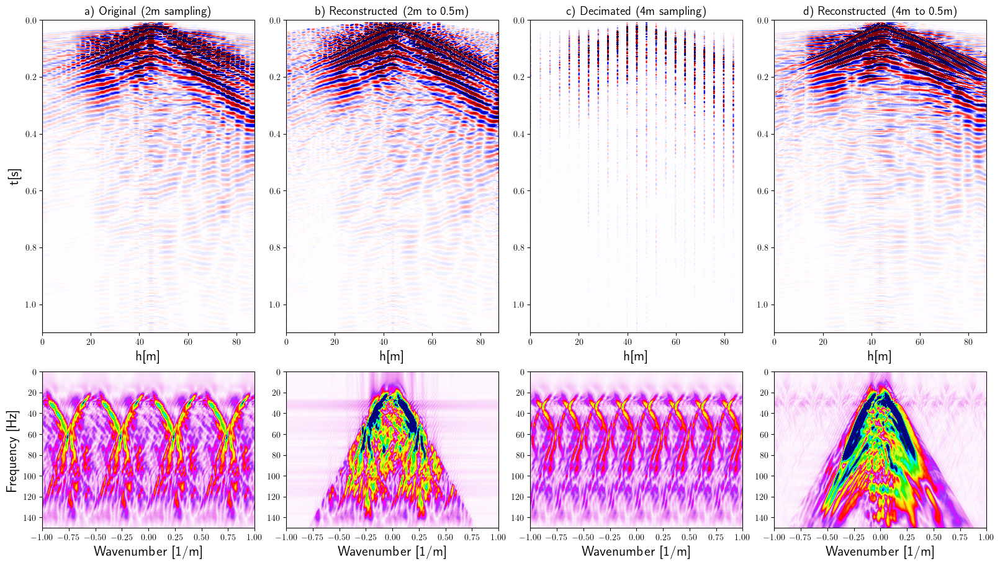

In [27]:
fig = plt.figure(constrained_layout=True, figsize=(16, 9))
axs = []
gs = fig.add_gridspec(3, 4)
axs.append(fig.add_subplot(gs[:2, 0]))
axs.append(fig.add_subplot(gs[:2, 1]))
axs.append(fig.add_subplot(gs[:2, 2]))
axs.append(fig.add_subplot(gs[:2, 3]))
axs.append(fig.add_subplot(gs[2:, 0]))
axs.append(fig.add_subplot(gs[2:, 1]))
axs.append(fig.add_subplot(gs[2:, 2]))
axs.append(fig.add_subplot(gs[2:, 3]))

axs[0].imshow((data).T, **show_seis_kwargs)
axs[0].set_title('a) Original (2m sampling)', fontsize=14)
axs[0].axis('tight')
axs[0].set_xlabel('h[m]')
axs[0].set_ylabel('t[s]')

axs[1].imshow((maskt2m*xinv2m_reg_FISTA).T, **show_seis_kwargs)
axs[1].set_title('b) Reconstructed (2m to 0.5m)', fontsize=14)
axs[1].axis('tight')
axs[1].set_xlabel('h[m]')

axs[2].imshow((data_mask4m).T, **show_seis_kwargs)
axs[2].set_title('c) Decimated (4m sampling)', fontsize=14)
axs[2].axis('tight')
axs[2].set_xlabel('h[m]')

axs[3].imshow((maskt4m*xinv4m).T, **show_seis_kwargs)
axs[3].set_title('d) Reconstructed (4m to 0.5m)', fontsize=14)
axs[3].axis('tight')
axs[3].set_xlabel('h[m]')

axs[4].imshow(np.fft.fftshift(np.abs((D).reshape(nfft_x,nfft_t//2+1)), axes=0).T, **show_fk_kwargs )
axs[4].set_xlim(-1/(2*dx), 1/(2*dx))
axs[4].set_ylim(150, f[0])
axs[4].set_xlabel('Wavenumber [1/m]')
axs[4].set_ylabel('Frequency [Hz]')

axs[5].imshow(np.fft.fftshift(np.abs((Fop*(maskt2m*xinv2m_reg_FISTA).ravel()).reshape(nfft_x,nfft_t//2+1)), axes=0).T, **show_fk_kwargs)
axs[5].set_xlim(-1/(2*dx), 1/(2*dx))
axs[5].set_ylim(150, f[0])
axs[5].set_xlabel('Wavenumber [1/m]')

axs[6].imshow(np.fft.fftshift(np.abs((Fop*(data_mask4m).ravel()).reshape(nfft_x,nfft_t//2+1)), axes=0).T, **show_fk_kwargs)
axs[6].set_xlim(-1/(2*dx), 1/(2*dx))
axs[6].set_ylim(150, f[0])
axs[6].set_xlabel('Wavenumber [1/m]')

axs[7].imshow(np.fft.fftshift(np.abs((Fop*(maskt4m*xinv4m).ravel()).reshape(nfft_x,nfft_t//2+1)), axes=0).T, **show_fk_kwargs)
axs[7].set_xlim(-1/(2*dx), 1/(2*dx))
axs[7].set_ylim(150, f[0])
axs[7].set_xlabel('Wavenumber [1/m]')

for i in range(len(axs)):
    if i<4:
        axs[i].set_ylim((1.1,0))


# for i in range(len(axs)):
#     if i!=0 and i!=4:
#         axs[i].set_yticks([], [])
# plt.savefig(save_fig_folder+"Figure 3_Field data reconstruction.eps",format='eps')

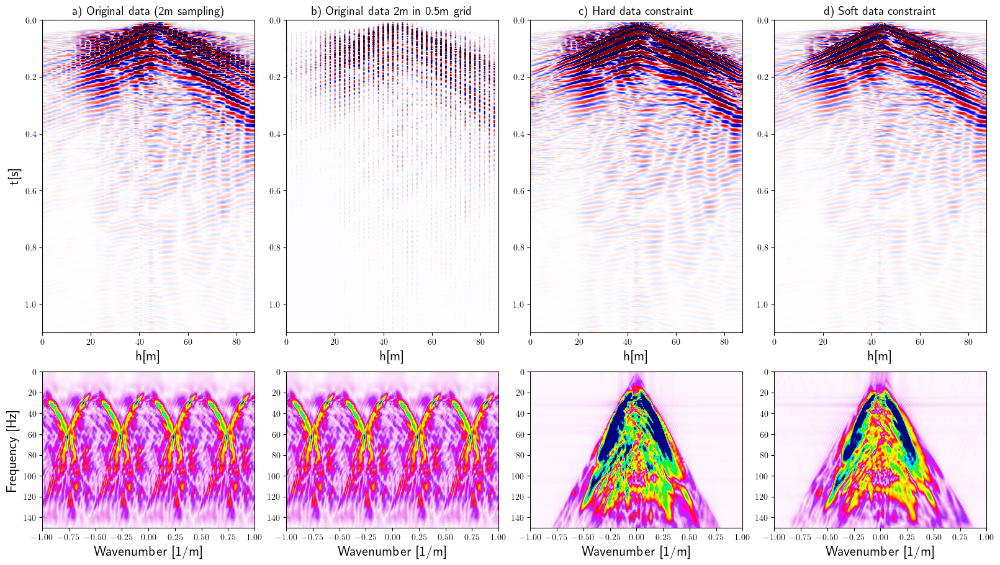

In [32]:
fig = plt.figure(constrained_layout=True, figsize=(16, 9))
axs = []
gs = fig.add_gridspec(3, 4)
axs.append(fig.add_subplot(gs[:2, 0]))
axs.append(fig.add_subplot(gs[:2, 1]))
axs.append(fig.add_subplot(gs[:2, 2]))
axs.append(fig.add_subplot(gs[:2, 3]))
axs.append(fig.add_subplot(gs[2:, 0]))
axs.append(fig.add_subplot(gs[2:, 1]))
axs.append(fig.add_subplot(gs[2:, 2]))
axs.append(fig.add_subplot(gs[2:, 3]))

axs[0].imshow((data).T, **show_seis_kwargs)
axs[0].set_title('a) Original data (2m sampling)', fontsize=14)
axs[0].axis('tight')
axs[0].set_xlabel('h[m]')
axs[0].set_ylabel('t[s]')

axs[1].imshow((data_mask2m).T, **show_seis_kwargs)
axs[1].set_title('b) Original data 2m in 0.5m grid', fontsize=14)
axs[1].axis('tight')
axs[1].set_xlabel('h[m]')

axs[2].imshow((maskt2m*(Fop.H*Mf*Fop*xinv2m)).T, **show_seis_kwargs)
axs[2].set_title('c) Hard data constraint', fontsize=14)
axs[2].axis('tight')
axs[2].set_xlabel('h[m]')

axs[3].imshow((maskt2m*xinv2m_FISTA).T, **show_seis_kwargs)
axs[3].set_title('d) Soft data constraint', fontsize=14)
axs[3].axis('tight')
axs[3].set_xlabel('h[m]')

axs[4].imshow(np.fft.fftshift(np.abs((D).reshape(nfft_x,nfft_t//2+1)), axes=0).T, **show_fk_kwargs )
axs[4].set_xlim(-1/(2*dx), 1/(2*dx))
axs[4].set_ylim(150, f[0])
axs[4].set_xlabel('Wavenumber [1/m]')
axs[4].set_ylabel('Frequency [Hz]')

axs[5].imshow(np.fft.fftshift(np.abs((Fop*(data_mask2m).ravel()).reshape(nfft_x,nfft_t//2+1)), axes=0).T, **show_fk_kwargs)
axs[5].set_xlim(-1/(2*dx), 1/(2*dx))
axs[5].set_ylim(150, f[0])
axs[5].set_xlabel('Wavenumber [1/m]')

axs[6].imshow(np.fft.fftshift(np.abs((Fop*(maskt2m*(Fop.H*Mf*Fop*xinv2m)).ravel()).reshape(nfft_x,nfft_t//2+1)), axes=0).T, **show_fk_kwargs)
axs[6].set_xlim(-1/(2*dx), 1/(2*dx))
axs[6].set_ylim(150, f[0])
axs[6].set_xlabel('Wavenumber [1/m]')

axs[7].imshow(np.fft.fftshift(np.abs((Fop*(maskt2m*xinv2m_FISTA).ravel()).reshape(nfft_x,nfft_t//2+1)), axes=0).T, **show_fk_kwargs)
axs[7].set_xlim(-1/(2*dx), 1/(2*dx))
axs[7].set_ylim(150, f[0])
axs[7].set_xlabel('Wavenumber [1/m]')

for i in range(len(axs)):
    if i<4:
        axs[i].set_ylim((1.1,0))


# for i in range(len(axs)):
#     if i!=0 and i!=4:
#         axs[i].set_yticks([], [])
plt.savefig(save_fig_folder+"Field data reconstruction-2m.eps",format='eps')
plt.savefig(save_fig_folder+"Field data reconstruction-2m.png",format='png')

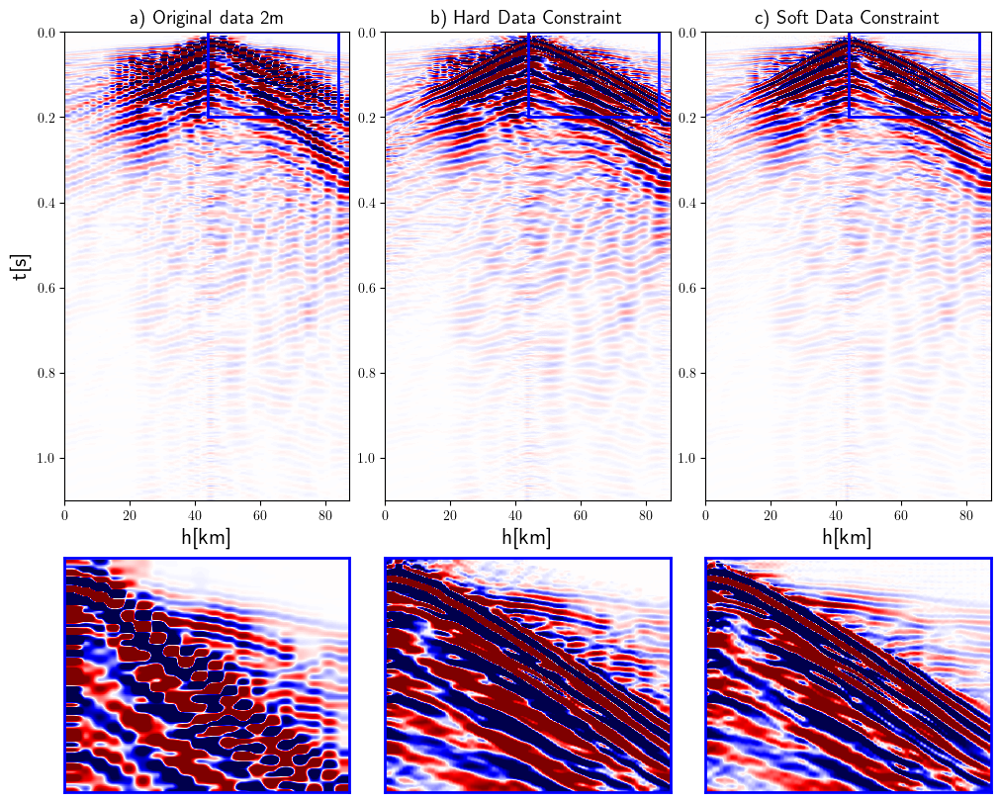

In [407]:
import matplotlib.patches as patches
x_start = len(x[x<44])
x_finish = len(x[x<84])
t_start = len(t[t<0])
t_finish = len(t[t<0.2])

# Convert indices to coordinates if needed
x_coord_start = x[x_start]
x_coord_finish = x[x_finish]
t_coord_start = t[t_start]
t_coord_finish = t[t_finish]

rect_color = 'blue'
# Create rectangle patches with actual axis coordinates
rect1 = patches.Rectangle(
    (x_coord_start, t_coord_start),  # use actual coordinates
    x_coord_finish - x_coord_start,  # width
    t_coord_finish - t_coord_start,  # height
    fill=False,
    edgecolor=rect_color,
    linewidth=2
)

rect2 = patches.Rectangle(
    (x_coord_start, t_coord_start),
    x_coord_finish - x_coord_start,
    t_coord_finish - t_coord_start,
    fill=False,
    edgecolor=rect_color,
    linewidth=2
)

rect3 = patches.Rectangle(
    (x_coord_start, t_coord_start),
    x_coord_finish - x_coord_start,
    t_coord_finish - t_coord_start,
    fill=False,
    edgecolor=rect_color,
    linewidth=2
)


xinv2_zoom = xinv2m_FISTA[x_start:x_finish,t_start:t_finish]
xinvPD_zoom = (maskt2m*(Fop.H*Mf*Fop*xinv2m))[x_start:x_finish,t_start:t_finish]
data_zoom = data[x_start//4:x_finish//4,t_start:t_finish]

fig = plt.figure(figsize=(10, 8),constrained_layout=True)
axs = []
gs = fig.add_gridspec(3, 3,width_ratios=[1, 1, 1])
axs.append(fig.add_subplot(gs[:2, 0]))
axs.append(fig.add_subplot(gs[:2, 1],sharey=axs[0]))
axs.append(fig.add_subplot(gs[:2, 2],sharey=axs[0]))
axs.append(fig.add_subplot(gs[2:, 0]))
axs.append(fig.add_subplot(gs[2:, 1]))
axs.append(fig.add_subplot(gs[2:, 2]))


axs[0].imshow(data.T,**show_seis_kwargs)
axs[0].set_title('a) Original data 2m ', fontsize=14)
axs[0].set_xlabel('h[km]')
axs[0].set_ylabel('t[s]')
axs[0].add_patch(rect1)

axs[1].imshow((maskt2m*(Fop.H*Mf*Fop*xinv2m)).T,**show_seis_kwargs)
axs[1].set_title('b) Hard Data Constraint ', fontsize=14)
axs[1].set_xlabel('h[km]')
axs[1].add_patch(rect2)

axs[2].imshow(xinv2m_FISTA.T,**show_seis_kwargs)
axs[2].set_title('c) Soft Data Constraint ', fontsize=14)
axs[2].set_xlabel('h[km]')
axs[2].add_patch(rect3)

axs[3].imshow(data_zoom.T,**show_seis_kwargs)
axs[3].tick_params(
   bottom=False, labelbottom=False,
   left=False,   labelleft=False
)
for spine in axs[3].spines.values():
    spine.set_color(rect_color)
    spine.set_linewidth(2)
    
axs[4].imshow(xinvPD_zoom.T,**show_seis_kwargs)
axs[4].tick_params(
   bottom=False, labelbottom=False,
   left=False,   labelleft=False
)
for spine in axs[4].spines.values():
    spine.set_color(rect_color)
    spine.set_linewidth(2)
    
axs[5].imshow(xinv2_zoom.T,**show_seis_kwargs)
axs[5].tick_params(
   bottom=False, labelbottom=False,
   left=False,   labelleft=False
)
for spine in axs[5].spines.values():
    spine.set_color(rect_color)
    spine.set_linewidth(2)

for i in range(len(axs)):
    if i<4:
        axs[i].set_ylim((1.1,0))

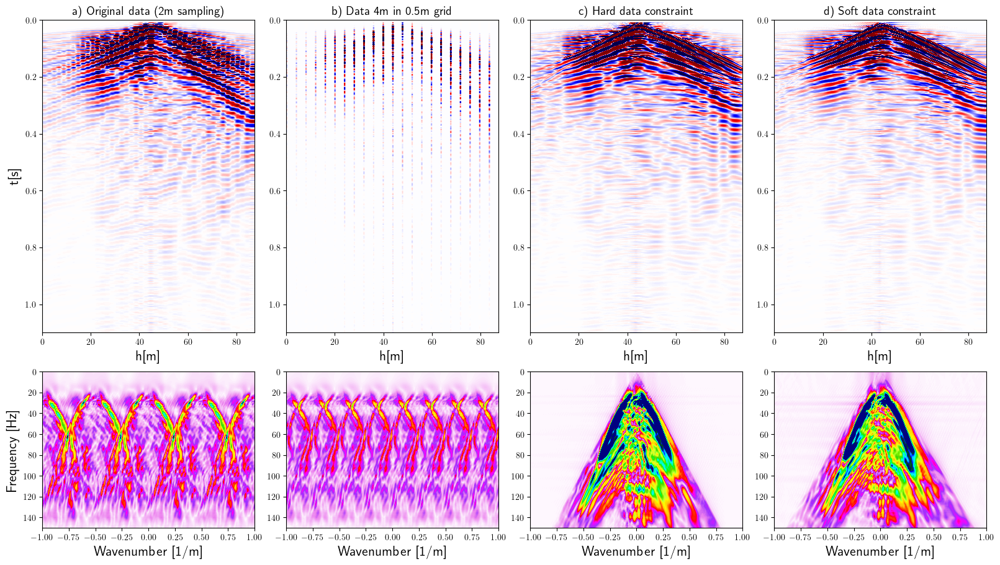

In [33]:
fig = plt.figure(constrained_layout=True, figsize=(16, 9))
axs = []
gs = fig.add_gridspec(3, 4)
axs.append(fig.add_subplot(gs[:2, 0]))
axs.append(fig.add_subplot(gs[:2, 1]))
axs.append(fig.add_subplot(gs[:2, 2]))
axs.append(fig.add_subplot(gs[:2, 3]))
axs.append(fig.add_subplot(gs[2:, 0]))
axs.append(fig.add_subplot(gs[2:, 1]))
axs.append(fig.add_subplot(gs[2:, 2]))
axs.append(fig.add_subplot(gs[2:, 3]))

axs[0].imshow((data).T, **show_seis_kwargs)
axs[0].set_title('a) Original data (2m sampling)', fontsize=14)
axs[0].axis('tight')
axs[0].set_xlabel('h[m]')
axs[0].set_ylabel('t[s]')

axs[1].imshow((data_mask4m).T, **show_seis_kwargs)
axs[1].set_title('b) Data 4m in 0.5m grid', fontsize=14)
axs[1].axis('tight')
axs[1].set_xlabel('h[m]')

axs[2].imshow((maskt4m*(Fop.H*Mf*Fop*xinv4m)).T, **show_seis_kwargs)
axs[2].set_title('c) Hard data constraint', fontsize=14)
axs[2].axis('tight')
axs[2].set_xlabel('h[m]')

axs[3].imshow((maskt4m*xinv4m_FISTA).T, **show_seis_kwargs)
axs[3].set_title('d) Soft data constraint', fontsize=14)
axs[3].axis('tight')
axs[3].set_xlabel('h[m]')

axs[4].imshow(np.fft.fftshift(np.abs((D).reshape(nfft_x,nfft_t//2+1)), axes=0).T, **show_fk_kwargs )
axs[4].set_xlim(-1/(2*dx), 1/(2*dx))
axs[4].set_ylim(150, f[0])
axs[4].set_xlabel('Wavenumber [1/m]')
axs[4].set_ylabel('Frequency [Hz]')

axs[5].imshow(np.fft.fftshift(np.abs((Fop*(data_mask4m).ravel()).reshape(nfft_x,nfft_t//2+1)), axes=0).T, **show_fk_kwargs)
axs[5].set_xlim(-1/(2*dx), 1/(2*dx))
axs[5].set_ylim(150, f[0])
axs[5].set_xlabel('Wavenumber [1/m]')

axs[6].imshow(np.fft.fftshift(np.abs((Fop*(maskt4m*(Fop.H*Mf*Fop*xinv4m)).ravel()).reshape(nfft_x,nfft_t//2+1)), axes=0).T, **show_fk_kwargs)
axs[6].set_xlim(-1/(2*dx), 1/(2*dx))
axs[6].set_ylim(150, f[0])
axs[6].set_xlabel('Wavenumber [1/m]')

axs[7].imshow(np.fft.fftshift(np.abs((Fop*(maskt4m*xinv4m_FISTA).ravel()).reshape(nfft_x,nfft_t//2+1)), axes=0).T, **show_fk_kwargs)
axs[7].set_xlim(-1/(2*dx), 1/(2*dx))
axs[7].set_ylim(150, f[0])
axs[7].set_xlabel('Wavenumber [1/m]')

for i in range(len(axs)):
    if i<4:
        axs[i].set_ylim((1.1,0))


# for i in range(len(axs)):
#     if i!=0 and i!=4:
#         axs[i].set_yticks([], [])
plt.savefig(save_fig_folder+"Field data reconstruction 4-m.eps",format='eps')
plt.savefig(save_fig_folder+"Field data reconstruction 4-m.png",format='png')

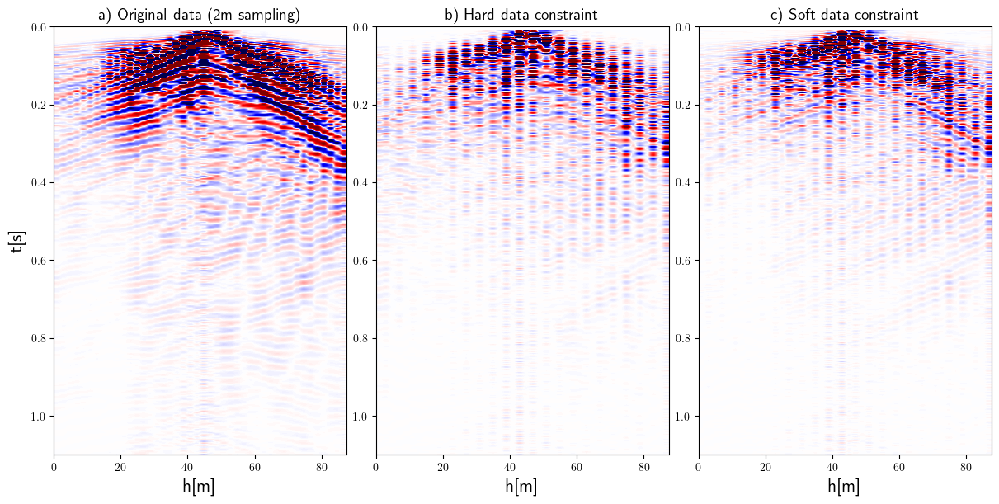

In [34]:
fig = plt.figure(constrained_layout=True, figsize=(12, 6))
axs = []
gs = fig.add_gridspec(2, 3)
axs.append(fig.add_subplot(gs[:2, 0]))
axs.append(fig.add_subplot(gs[:2, 1]))
axs.append(fig.add_subplot(gs[:2, 2]))


xdiff4m = (maskt4m*(Fop.H*Mf*Fop*xinv4m))[::4]-data
xdiff4m_FISTA = xinv4m_FISTA[::4]-data

axs[0].imshow((data).T, **show_seis_kwargs)
axs[0].set_title('a) Original data (2m sampling)', fontsize=14)
axs[0].axis('tight')
axs[0].set_xlabel('h[m]')
axs[0].set_ylabel('t[s]')

axs[1].imshow((xdiff4m).T, **show_seis_kwargs)
axs[1].set_title('b) Hard data constraint', fontsize=14)
axs[1].axis('tight')
axs[1].set_xlabel('h[m]')

axs[2].imshow((xdiff4m_FISTA).T, **show_seis_kwargs)
axs[2].set_title('c) Soft data constraint', fontsize=14)
axs[2].axis('tight')
axs[2].set_xlabel('h[m]')

for i in range(len(axs)):
    if i<4:
        axs[i].set_ylim((1.1,0))
plt.savefig(save_fig_folder+"Field data difference 4-m.eps",format='eps')
plt.savefig(save_fig_folder+"Field data difference 4-m.png",format='png')

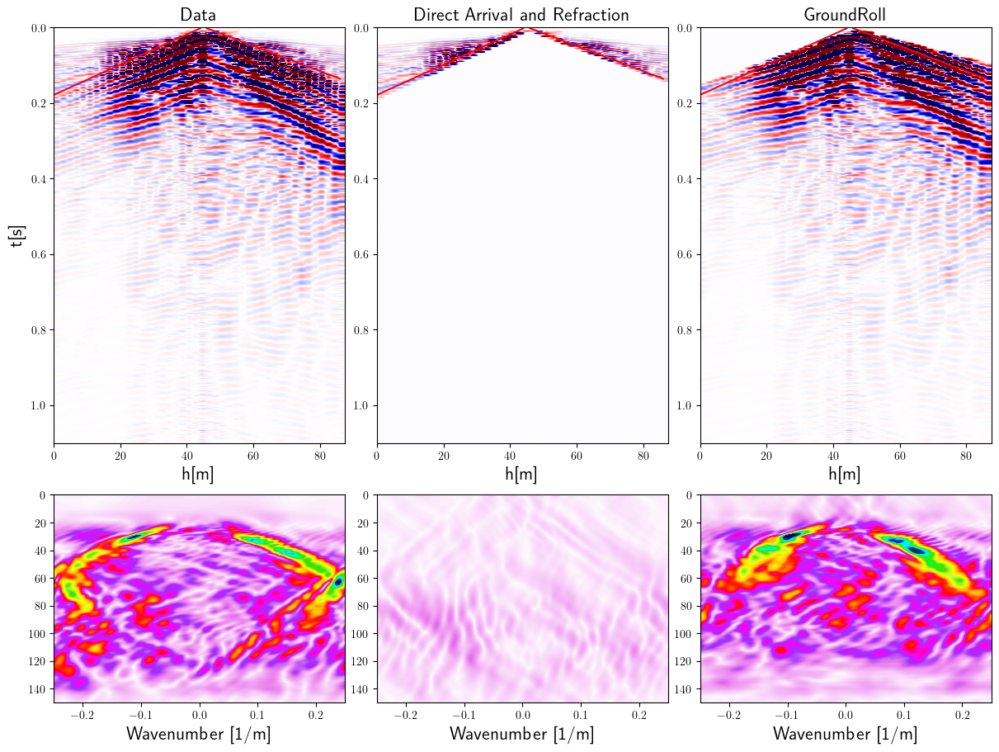

In [38]:
fig = plt.figure(constrained_layout=True, figsize=(12, 9))
axs = []
gs = fig.add_gridspec(3, 3)
axs.append(fig.add_subplot(gs[:2, 0]))
axs.append(fig.add_subplot(gs[:2, 1]))
axs.append(fig.add_subplot(gs[:2, 2]))
axs.append(fig.add_subplot(gs[2:, 0]))
axs.append(fig.add_subplot(gs[2:, 1]))
axs.append(fig.add_subplot(gs[2:, 2]))

axs[0].imshow(data_obs2m.T,  **show_seis_kwargs)
axs[0].set_ylim((1.1,0))
axs[0].set_title("Data")
axs[0].set_xlabel('h[m]')
axs[0].set_ylabel('t[s]')

axs[0].plot(offsetleft[mask2],itevent2[mask2]*dt,c='red')
axs[0].plot(offsetright[mask4],itevent4[mask4]*dt,c='red')

axs[1].imshow(data_cut2m.T,  **show_seis_kwargs)
axs[1].set_title("Direct Arrival and Refraction")
axs[1].set_ylim((1.1,0))

axs[1].plot(offsetleft[mask2],itevent2[mask2]*dt,c='red')
axs[1].plot(offsetright[mask4],itevent4[mask4]*dt,c='red')
axs[1].set_xlabel('h[m]')

axs[2].imshow(data_GR2m.T,  **show_seis_kwargs)
axs[2].set_title("GroundRoll")
axs[2].set_ylim((1.1,0))

axs[2].plot(offsetleft[mask2],itevent2[mask2]*dt,c='red')
axs[2].plot(offsetright[mask4],itevent4[mask4]*dt,c='red')
axs[2].set_xlabel('h[m]')

axs[3].imshow(np.fft.fftshift(np.abs((Fop*(Rop2m.H*data_obs2m).ravel()).reshape(nfft_x,nfft_t//2+1)), axes=0).T, **show_fk_kwargs)
axs[3].set_xlim(-1/(4), 1/(4))
axs[3].set_ylim(150, f[0])
axs[3].set_xlabel('Wavenumber [1/m]')

axs[4].imshow(np.fft.fftshift(np.abs((Fop*(Rop2m.H*data_cut2m).ravel()).reshape(nfft_x,nfft_t//2+1)), axes=0).T, **show_fk_kwargs)
axs[4].set_xlim(-1/(4), 1/(4))
axs[4].set_ylim(150, f[0])
axs[4].set_xlabel('Wavenumber [1/m]')

axs[5].imshow(np.fft.fftshift(np.abs((Fop*(Rop2m.H*data_GR2m).ravel()).reshape(nfft_x,nfft_t//2+1)), axes=0).T, **show_fk_kwargs)
axs[5].set_xlim(-1/(4), 1/(4))
axs[5].set_ylim(150, f[0])
axs[5].set_xlabel('Wavenumber [1/m]')

plt.savefig(save_fig_folder+"Signal Separation.eps",format='eps')
plt.savefig(save_fig_folder+"Signal Separation.png",format='png')

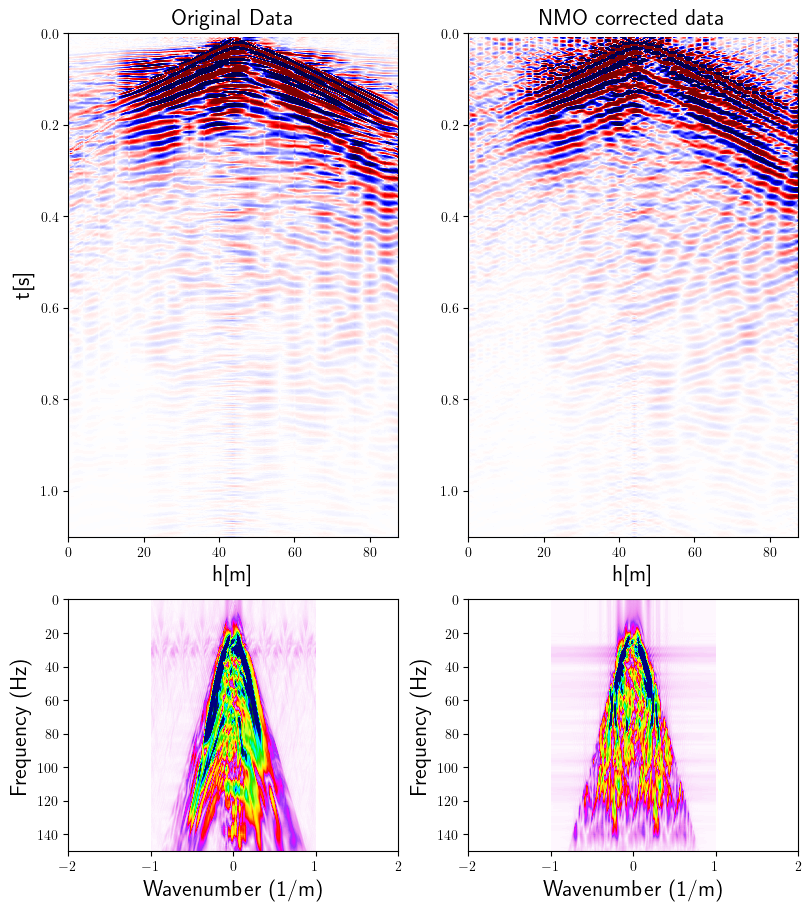

In [39]:
fig = plt.figure(constrained_layout=True, figsize=(8, 9))
axs = []
gs = fig.add_gridspec(3, 2)
axs.append(fig.add_subplot(gs[:2, 0]))
axs.append(fig.add_subplot(gs[:2, 1]))
axs.append(fig.add_subplot(gs[2:, 0]))
axs.append(fig.add_subplot(gs[2:, 1]))

axs[0].imshow(xinv4m.T,  **show_seis_kwargs)
axs[0].set_ylim((1.1,0))
axs[0].set_title("Original Data")
axs[0].set_xlabel('h[m]')
axs[0].set_ylabel('t[s]')

axs[1].imshow(xinv2m_reg_FISTA.T,  **show_seis_kwargs)
axs[1].set_title("NMO corrected data")
axs[1].set_ylim((1.1,0))
axs[1].set_xlabel('h[m]')

axs[2].imshow(np.fft.fftshift(np.abs(Fop*xinv4m).T, axes=1), **show_fk_kwargs)
axs[2].set_xlim(-1/(dx), 1/(dx))
axs[2].set_ylim(150,0)
axs[2].set_xlabel("Wavenumber (1/m)")
axs[2].set_ylabel("Frequency (Hz)")

axs[3].imshow(np.fft.fftshift(np.abs(Fop*xinv2m_reg_FISTA).T, axes=1), **show_fk_kwargs)
axs[3].set_xlim(-1/(dx), 1/(dx))
axs[3].set_ylim(150,0)
axs[3].set_xlabel("Wavenumber (1/m)")
axs[3].set_ylabel("Frequency (Hz)")
plt.savefig(save_fig_folder+"Regular Comparison.eps",format='eps')

In [40]:
xinv4m_masked = Fop.H*Mf*Fop*xinv4m

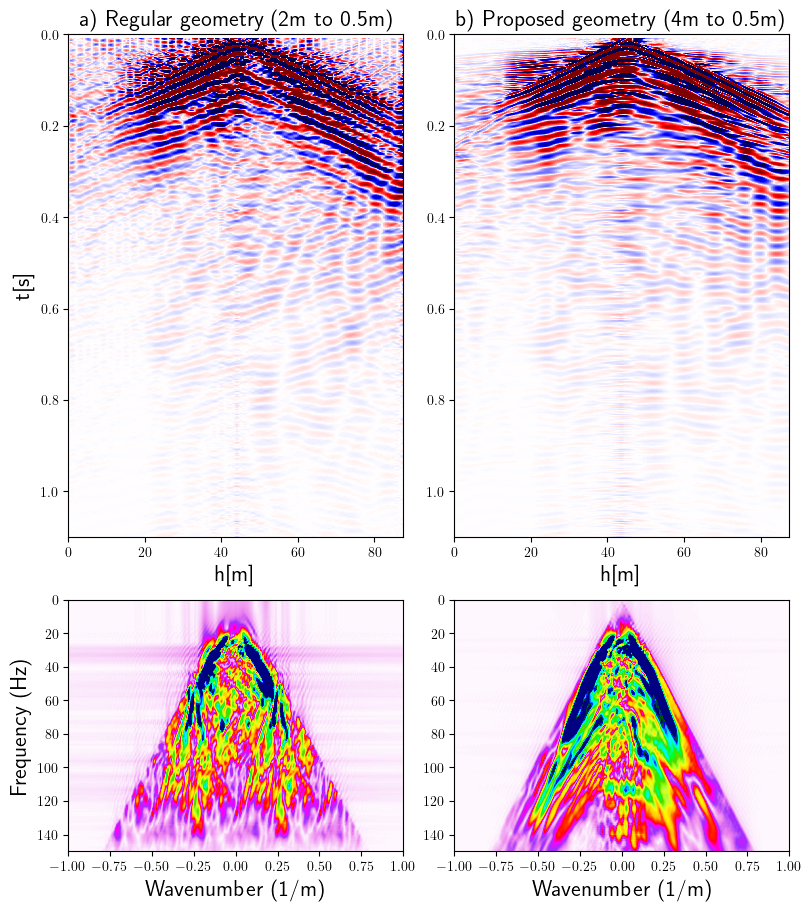

In [33]:
fig = plt.figure(constrained_layout=True, figsize=(8, 9))
axs = []
gs = fig.add_gridspec(3, 2)
axs.append(fig.add_subplot(gs[:2, 0]))
axs.append(fig.add_subplot(gs[:2, 1]))
axs.append(fig.add_subplot(gs[2:, 0]))
axs.append(fig.add_subplot(gs[2:, 1]))

axs[0].imshow(xinv2m_reg_FISTA.T,  **show_seis_kwargs)
axs[0].set_ylim((1.1,0))
axs[0].set_title("a) Regular geometry (2m to 0.5m)")
axs[0].set_xlabel('h[m]')
axs[0].set_ylabel('t[s]')

axs[1].imshow(xinv4m_masked.T,  **show_seis_kwargs)
axs[1].set_title("b) Proposed geometry (4m to 0.5m)")
axs[1].set_ylim((1.1,0))
axs[1].set_xlabel('h[m]')

axs[2].imshow(np.fft.fftshift(np.abs(Fop*xinv2m_reg_FISTA).T, axes=1), **show_fk_kwargs)
axs[2].set_xlim(-1/(2*dx), 1/(2*dx))
axs[2].set_ylim(150,0)
axs[2].set_xlabel("Wavenumber (1/m)")
axs[2].set_ylabel("Frequency (Hz)")

axs[3].imshow(np.fft.fftshift(np.abs(Fop*xinv4m_masked).T, axes=1), **show_fk_kwargs)
axs[3].set_xlim(-1/(2*dx), 1/(2*dx))
axs[3].set_ylim(150,0)
axs[3].set_xlabel("Wavenumber (1/m)")
plt.savefig(save_fig_folder+"Regular Comparison.eps",format='eps')

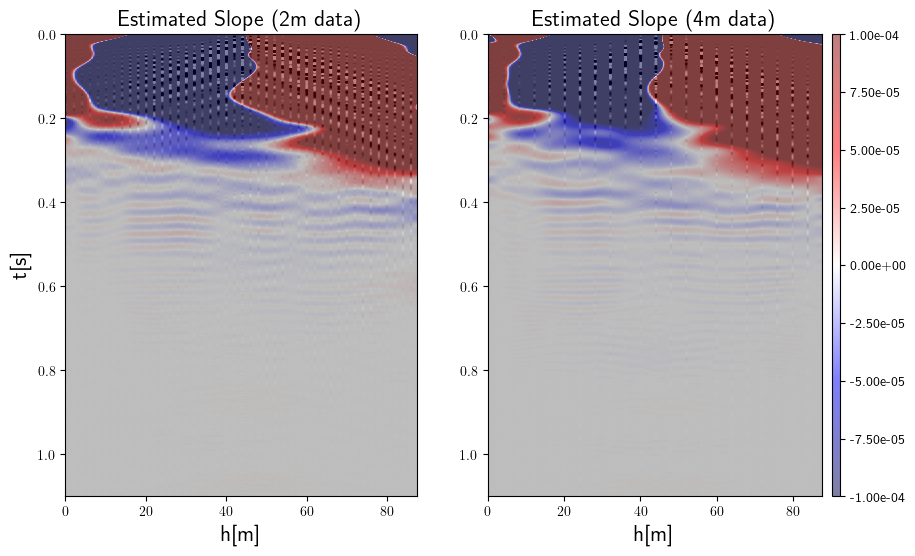

In [52]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as ticker
fig = plt.figure(constrained_layout=False, figsize=(10, 6))
axs = []
gs = fig.add_gridspec(2, 2)
axs.append(fig.add_subplot(gs[:2, 0]))
axs.append(fig.add_subplot(gs[:2, 1]))


axs[1].imshow(data_mask4m.T,aspect='auto',vmin=-clip_v, vmax=clip_v,cmap='gray',extent=[x[0],x[-1],t[-1],t[0]])
axs[1].imshow(DataGR4m.slope,aspect='auto',cmap='seismic',vmin=-clip_slope,vmax=clip_slope,alpha=0.5,extent=[x[0],x[-1],t[-1],t[0]])
axs[1].set_title("Estimated Slope (4m data)")
axs[1].set_xlabel('h[m]')
axs[1].set_ylim((1.1,0))

axs[0].imshow(data_mask2m.T,aspect='auto',vmin=-clip_v, vmax=clip_v,cmap='gray',extent=[x[0],x[-1],t[-1],t[0]])
plot = axs[0].imshow(DataGR2m.slope,aspect='auto',cmap='seismic',vmin=-clip_slope,vmax=clip_slope,alpha=0.5,extent=[x[0],x[-1],t[-1],t[0]])
axs[0].set_title("Estimated Slope (2m data)")
axs[0].set_xlabel('h[m]')
axs[0].set_ylabel('t[s]')
axs[0].set_ylim((1.1,0))

# Add colorbar for Image A
divider = make_axes_locatable(axs[1])
cax = divider.append_axes("right", size="2.5%", pad=0.1)  # Adjust size and pad for better alignment
cbar = plt.colorbar(plot, cax=cax)
formatter = ticker.FormatStrFormatter("%.2e")
cbar.ax.yaxis.set_major_formatter(formatter)

plt.savefig(save_fig_folder+"Slope estimation-field.eps",format='eps')
plt.savefig(save_fig_folder+"Slope estimation-field.png",format='png')

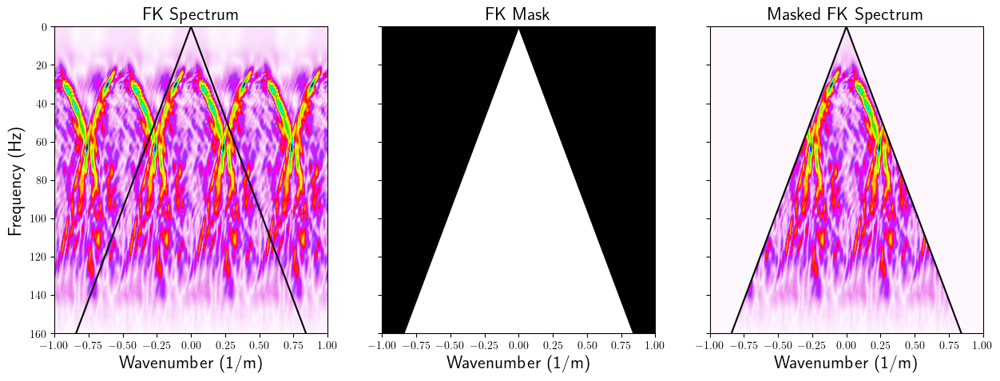

In [54]:
fig, axs = plt.subplots(1, 3, sharey=True, figsize=(15, 5))
axs[0].imshow(np.fft.fftshift(np.abs(D).T, axes=1), **show_fk_kwargs)

axs[0].plot(f/vel, f,'k'), axs[0].plot(-f/vel, f,'k')
axs[0].set_xlim(-1/(2*dx), 1/(2*dx))
axs[0].set_xlabel('Wavenumber (1/m)')
axs[0].set_ylabel('Frequency (Hz)')
axs[0].set_title('FK Spectrum')

axs[1].imshow(np.fft.fftshift(mask_fk, axes=1), cmap='gray',aspect='auto',
              extent=(np.fft.fftshift(ks)[0], np.fft.fftshift(ks)[-1], f[nfft_t//2-1], f[0]))

axs[1].plot(f/vel, f,'k'), axs[1].plot(-f/vel, f,'k')
axs[1].set_xlim(-1/(2*dx), 1/(2*dx))
axs[1].set_xlabel('Wavenumber (1/m)')
axs[1].set_title('FK Mask')

axs[2].imshow(np.fft.fftshift((mask_fk)*np.abs(D).T, axes=1), **show_fk_kwargs)

axs[2].plot(f/vel, f,'k'), axs[2].plot(-f/vel, f,'k')
axs[2].set_xlim(-1/(2*dx), 1/(2*dx))
axs[2].set_ylim(fk_uplim, 0)
axs[2].set_xlabel('Wavenumber (1/m)')
axs[2].set_title('Masked FK Spectrum')

plt.savefig(save_fig_folder+"FK Mask-field.eps",format='eps')
plt.savefig(save_fig_folder+"FK Mask-field.png",format='png')